In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
import pandas as pd
import numpy as np
from glob import glob
import re
import librosa
import librosa.display
import matplotlib.pyplot as plt

import IPython.display as ipd

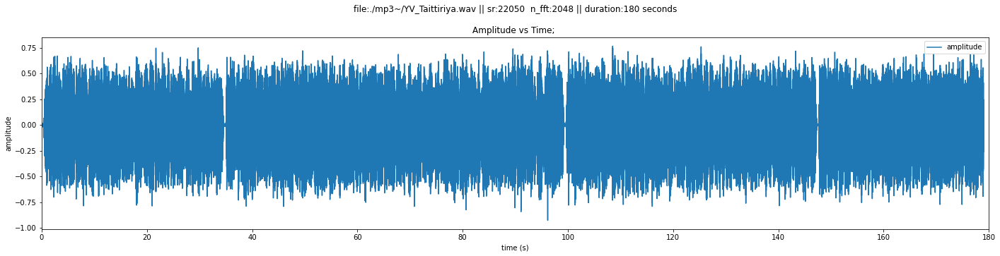

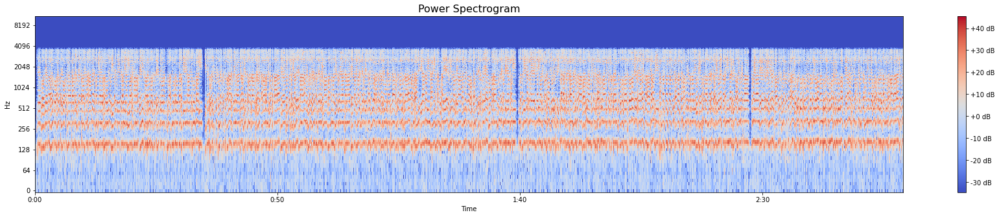

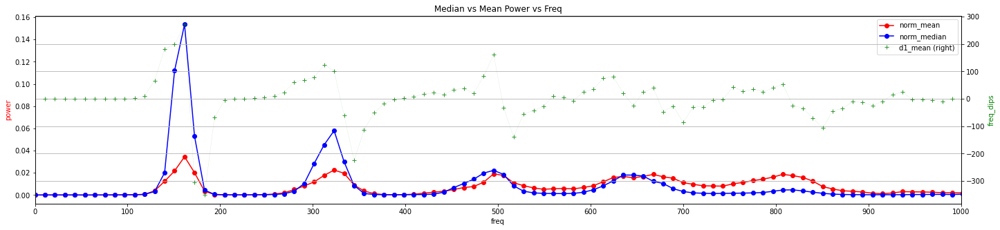

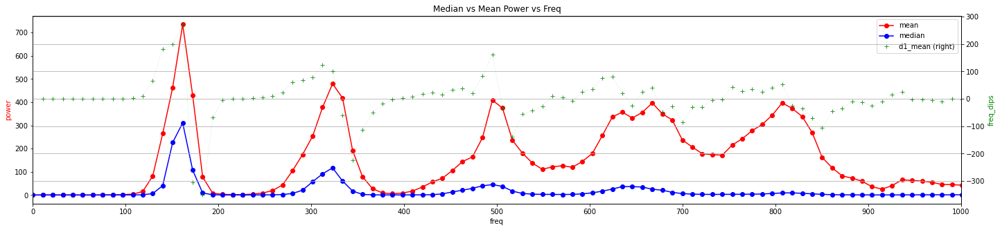

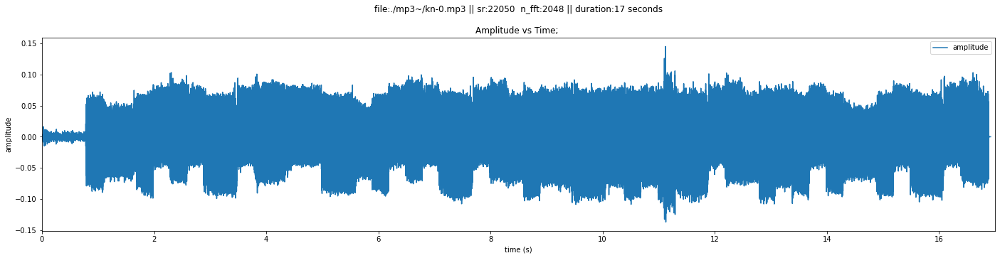

...

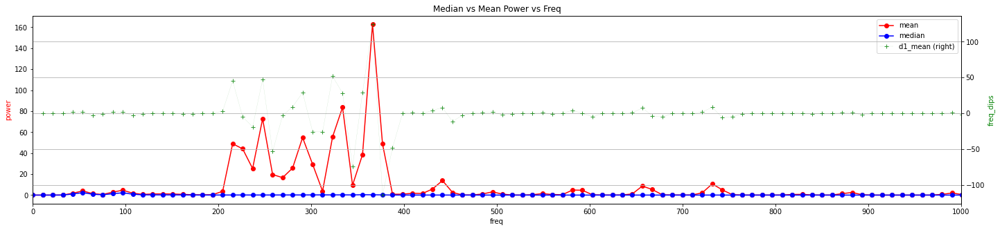

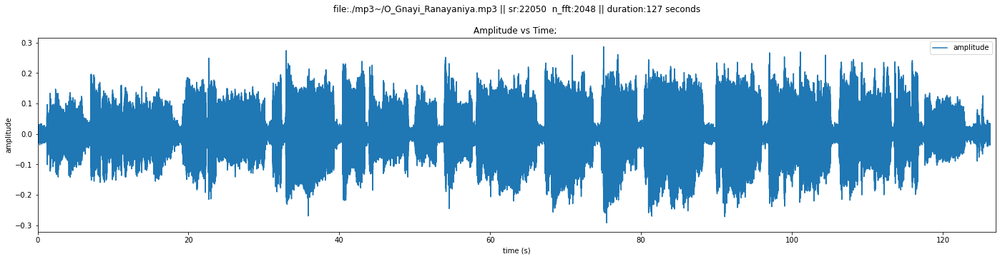

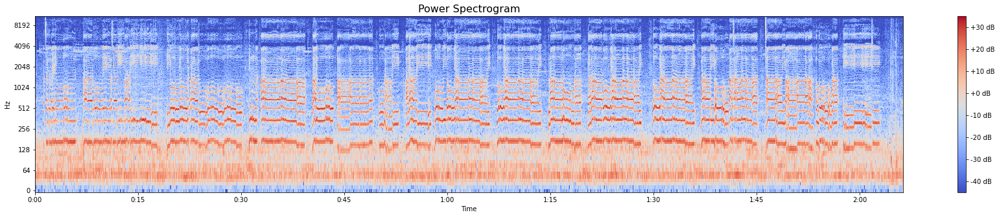

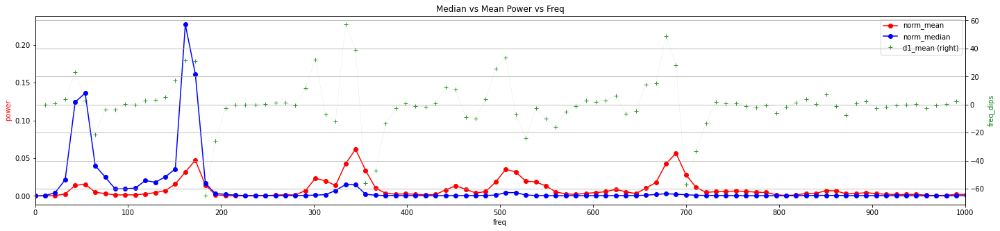

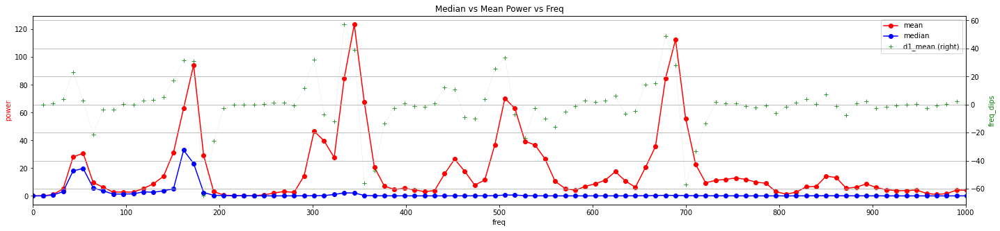

In [7]:
files = glob('./mp3~/*')
sr = 22050
n_fft = 2048

for f in files[1:] :
    x, sr = librosa.load(f)
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    D = librosa.stft(x)
    times = librosa.frames_to_time(np.arange(D.shape[1]), sr=sr, n_fft=n_fft)   
    duration_seconds = int(x.shape[0]/sr)+1
    D_magnitude = np.abs(D)
    D_phase = np.angle(D)
    D_power = D_magnitude**2
    D_power_db = librosa.power_to_db(D_power)
    Xdb = librosa.amplitude_to_db(abs(D))

    #=======
    ipd.display(ipd.Audio(f))
    #=======
    ax = pd.DataFrame(
        {'amplitude' : x},
        index = [ x/sr for x in range(x.shape[0]) ]
    ).plot(figsize=(24, 5), title=f'file:{f} || sr:{sr}  n_fft:{n_fft} || duration:{duration_seconds} seconds\n\nAmplitude vs Time; ')
    ax.set_xlabel('time (s)')
    ax.set_xlim(0, duration_seconds)
    ax.set_ylabel('amplitude')

    #=======
    fig, ax = plt.subplots(figsize=(30, 5))
    ax.set_title(f'Power Spectrogram', fontsize=16, y=1.0)
    img = librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log', ax=ax)
    fig.colorbar(img, ax=ax, format="%+2.f dB")


    #=======
    d1 = pd.DataFrame(D_power).apply(np.median, axis=1); d1.name = 'median'
    d2 = pd.DataFrame(D_power).apply(np.mean, axis=1); d2.name = 'mean'
    df = pd.DataFrame(d1).merge(pd.DataFrame(d2), left_index=True, right_index=True).assign(
        freq=freqs,
        unit_mean = lambda x: (x['mean'] - x['mean'].min())/(x['mean'].max()-x['mean'].min()),
        unit_median = lambda x: (x['median'] - x['median'].min())/(x['median'].max()-x['median'].min()),
        norm_mean = lambda x: x['mean']/x['mean'].sum(),
        norm_median = lambda x: x['median']/x['median'].sum(),
        d1_mean = lambda x: x['mean'].diff().shift(0),
        d1_median = lambda x: x['median'].diff().shift(0),
        d2_mean = lambda x: x['d1_mean'].diff().shift(1),
        d2_median = lambda x: x['d1_median'].diff().shift(1),
    )#.set_index('freq')
    
    for tag in ['norm_', ''] :
        ax = df[['freq', f'{tag}mean' , f'{tag}median']].plot(figsize=(24, 5), 
                    title=f'Median vs Mean Power vs Freq', 
                    x='freq', 
                    # secondary_y=f'{tag}median', 
                    mark_right=False , color=['r', 'b'] , marker='o' , 
        )
        ax.set_ylabel('power', color='r')
        ax = df[['freq', f'd1_mean']].plot(
            x='freq', 
            secondary_y=f'd1_mean', 
            mark_right=True , color=['g'], ls=':', marker='+', alpha=0.8, lw=.2,
            ax=ax
        )

        ax.set_xlabel('freq')
        ax.set_ylabel('freq_dips', color='g')
        # ax.right_ax.set_ylabel('d2_mean', color='b')
        ax.set_xticks(np.arange(0,1000+1,100).astype(int))
        # ax.set_xticklabels ([ f'{(freqs[2]-freqs[1])*x:.0f}' for x in ax.get_xticks()])
        ax.set_xlim(0, 1000)
        ax.grid(True)
        plt.show()





In [3]:
sr = 22050
n_fft = 2048
freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
freqs.shape, freqs.min(), freqs.max(), freqs[1], freqs[0], pd.Series(freqs).diff().min(), pd.Series(freqs).diff().max()


((1025,), 0.0, 11025.0, 10.7666015625, 0.0, 10.7666015625, 10.7666015625)

In [5]:

freqs = librosa.fft_frequencies(sr=22050, n_fft=2048)
freqs.shape, freqs.min(), freqs.max(), freqs[1], freqs[0], pd.Series(freqs).diff().min(), pd.Series(freqs).diff().max()

((1025,), 0.0, 11025.0, 10.7666015625, 0.0, 10.7666015625, 10.7666015625)

In [16]:
def fft_plot(signal, sr=22050, n_fft=2048):
    fft = np.fft.fft(signal)
    magnitude = np.abs(fft)
    print(magnitude.shape, signal.shape)
    t = np.linspace(0, len(magnitude)/sr, len(magnitude))

    # Compute the power spectrum
    power_spectrum = np.abs(fft) ** 2
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

    power_spectrum_db = librosa.power_to_db(power_spectrum)

    # Plot the signal and power spectrum
    fig, ax = plt.subplots(3-1, 1, figsize=(15, 8), sharex=not True, sharey=not True, gridspec_kw={'hspace': 0.25})
    ax[0].plot(t, signal)
    ax[0].set_xlabel('Time (s)')
    ax[0].set_ylabel('Amplitude')
    ax[1].plot(power_spectrum_db)
    ax[1].set_xlabel('Frequency (Hz)')
    ax[1].set_ylabel('Power')
    print ( ax[1].get_xticks() )
    # ax[2].plot(freqs[:len(power_spectrum)//10] , power_spectrum[:len(power_spectrum)//10])
    # ax[2].set_xlabel('Frequency (Hz)')
    # ax[2].set_ylabel('Power')
    plt.show()





In [44]:
x

array([-1.14293936e-04, -1.59357769e-05, -2.17587702e-04, ...,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00], dtype=float32)

In [45]:
x.shape

(1334643,)

In [67]:
y, sr = librosa.load(glob('./mp3~/*')[0], sr=22050)
D = librosa.stft(y, n_fft=2048)
D_magnitude = np.abs(D)
D_phase = np.angle(D)
D_power = D_magnitude**2
D_power_db = librosa.power_to_db(D_power)
D_power_db.shape

/Users/sunder/miniforge3/envs/tfmetal/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


(1025, 2607)

In [1]:
# a function to   plot the spectrogram of the first channel of the audio_file
def plot_spectrogram(audio_file, sr=22050, n_fft=2048):
    y, sr = librosa.load(audio_file, sr=sr)
    D = librosa.stft(y, n_fft=n_fft)
    D_magnitude = np.abs(D)
    D_power = D_magnitude**2
    D_power_db = librosa.power_to_db(D_power)
    # freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)
    # times = librosa.frames_to_time(np.arange(D_power_db.shape[1]), sr=sr, n_fft=n_fft)
    fig, ax = plt.subplots(figsize=(14, 5))
    img = librosa.display.specshow(D_power_db, sr=sr, x_axis='time', y_axis='log', ax=ax)
    ax.set(title='Power spectrogram')
    fig.colorbar(img, ax=ax, format="%+2.f dB")
    plt.show()

plot_spectrogram(glob('./mp3~/*')[0])


NameError: name 'glob' is not defined

/Users/sunder/miniforge3/envs/tfmetal/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


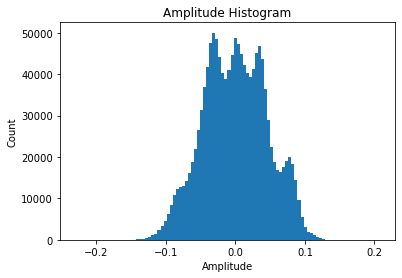

In [88]:
# plot histogram of the audio file
def plot_audio_hist(audio_file) :
    y, sr = librosa.load(audio_file, sr=22050)
    fig, ax = plt.subplots()
    ax.hist(y, bins=100)
    ax.set(xlabel='Amplitude', ylabel='Count', title='Amplitude Histogram')
    plt.show()

plot_audio_hist(glob('./mp3~/*')[0])

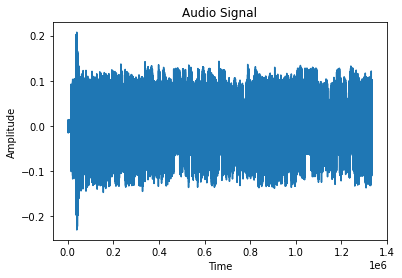

In [168]:
# plot frequency of the audio file
def plot_audio_freq(audio_file) :
    y, sr = librosa.load(audio_file, sr=22050)
    fig, ax = plt.subplots()
    ax.plot(y)
    ax.set(xlabel='Time', ylabel='Amplitude', title='Audio Signal')
    plt.show()

plot_audio_freq(glob('./mp3~/*')[0])

/Users/sunder/miniforge3/envs/tfmetal/lib/python3.9/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


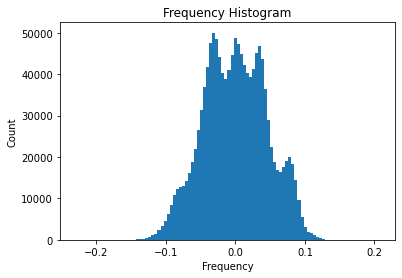

In [82]:
# ploot frequency histogram of the audio file
def plot_audio_freq_hist(audio_file) :
    y, sr = librosa.load(audio_file, sr=22050)
    fig, ax = plt.subplots()
    ax.hist(y, bins=100)
    ax.set(xlabel='Frequency', ylabel='Count', title='Frequency Histogram')
    plt.show()

plot_audio_freq_hist(glob('./mp3~/*')[0])


./mp3~/O_Gnayi_Ranayaniya.mp3


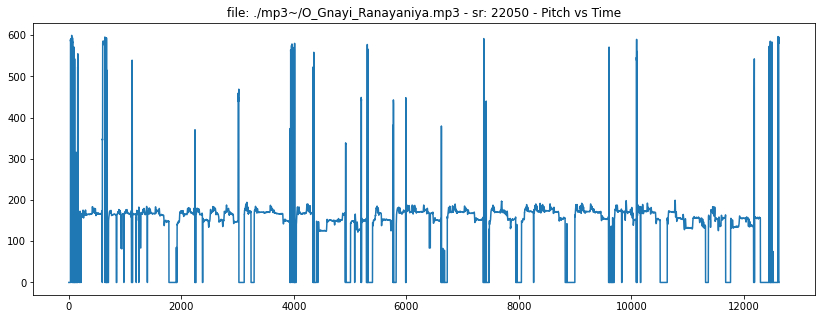

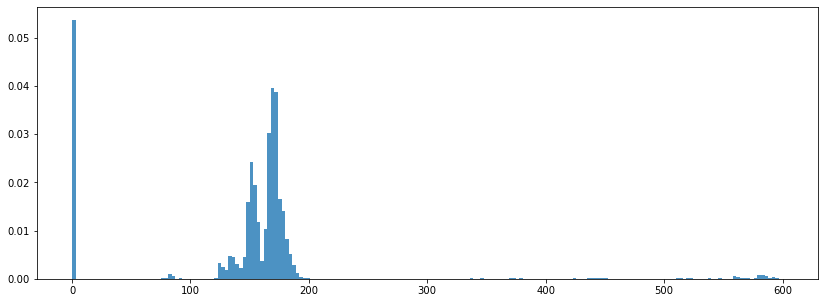

In [263]:
import parselmouth
import numpy as np

f = glob('./mp3~/*')[3]
print (f)
ipd.display(ipd.Audio(f))
sound = parselmouth.Sound(f)
pitch = sound.to_pitch()
pitch_values = pitch.selected_array['frequency']
pd.Series(pitch_values).plot( figsize=(14, 5) , title=f'file: {f} - sr: {sr} - Pitch vs Time')
# pitch_values#[pitch_values==0] = np.nan
plt.figure(figsize=(14, 5))
plt.hist(pitch_values, bins=200, density=True, histtype='stepfilled', alpha=0.8)
plt.show()

# from scipy.stats import norm



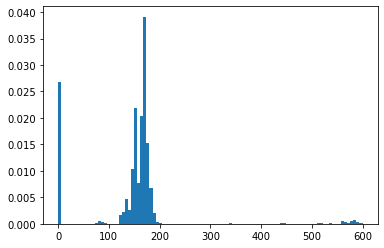

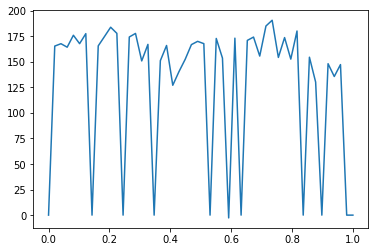

In [256]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import CubicSpline

plt.hist(pitch_values, bins=100, density=True)

plt.show()

x = np.linspace(0, 1, len(pitch_values))
cs = CubicSpline(x, pitch_values)
xs = np.linspace(0, 1, 50)
plt.plot(xs, cs(xs))
plt.show()

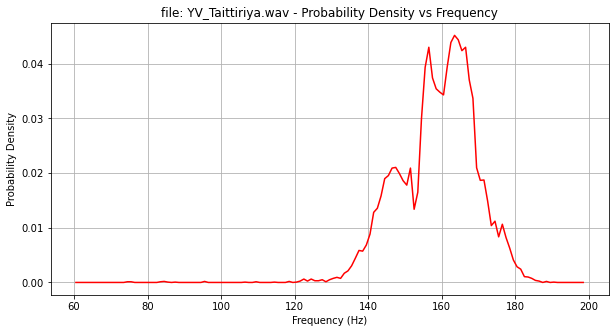

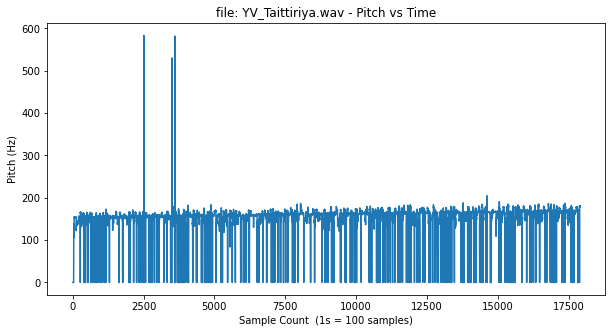

In [42]:
import parselmouth
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_pitch_vs_time(file_path, fmin=60, fmax=200, ax=None):
    # Load the audio file
    sound = parselmouth.Sound(file_path)

    # Extract the pitch contour
    pitch = sound.to_pitch()
    pitch_values = pitch.selected_array['frequency']

    # Define the frequency range of interest
    bins = np.arange(fmin, fmax)

    # Compute the histogram of pitch values
    hist, bins = np.histogram(pitch_values, bins=bins)

    # Compute the probability density
    pdf = hist / np.sum(hist)

    # Compute the frequency bin centers
    freqs = (bins[:-1] + bins[1:]) / 2

    # Plot the probability density vs frequency
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(freqs, pdf, color='red')
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Probability Density')
    file_name = file_path.split('/')[-1]
    ax.set_title(f'file: {file_name} - Probability Density vs Frequency')
    ax.grid(True)

    # Plot the pitch contour vs time
    fig, ax1 = plt.subplots(figsize=(10, 5))
    pd.Series(pitch_values).plot(ax=ax1, title=f'file: {file_name} - Pitch vs Time')
    ax1.set_xlabel('Sample Count  (1s = 100 samples)')
    ax1.set_ylabel('Pitch (Hz)')
    return

plot_pitch_vs_time(glob('./mp3~/*')[1])

